# Introduction to Raster Data with `rasterio`: Part 1

### Goals for Part 1:

- Raster basics

- Load WorldClim data on current climate

- Query points

- Reproject rasters


In [108]:
#Import our basic libraries

import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import geopandas as gpd

import seaborn as sns

In [109]:
#Import our rasterio stuff
########

import rasterio
from rasterio.plot import show
import rasterio.mask


In [110]:
#Other raster stuff we'll need to import for this notebook:
from rasterio.warp import calculate_default_transform, reproject, Resampling

In [111]:
#Need for pretty colorbar:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [112]:
import warnings
warnings.filterwarnings("ignore")

### WorldClim and Current Climate:

- Go to www.worldclim.org to download various climate variables at different resolutions.

- Provided are masked raster files of mean historical temperature for just the contiguous US:

    - 'USA_Mean_Temp_10minutes.tif'
    - 'USA_Mean_Temp_30seconds.tif'

Let's just look at historical (1970-2000 average) mean annual temperature in the contiguous USA and go through some `rasterio` basics.

- Note the following is partially adapted from the `rasterio` documentation at https://rasterio.readthedocs.io/en/latest/quickstart.html#id2


Before we get our raster, let's load US state/county vectors again...

### USA State/County Vectors:

Let's grab our state and county vectors...

- Note that we'll use EPSG 4326 to start: Match to WorldClim Rasters

<AxesSubplot: >

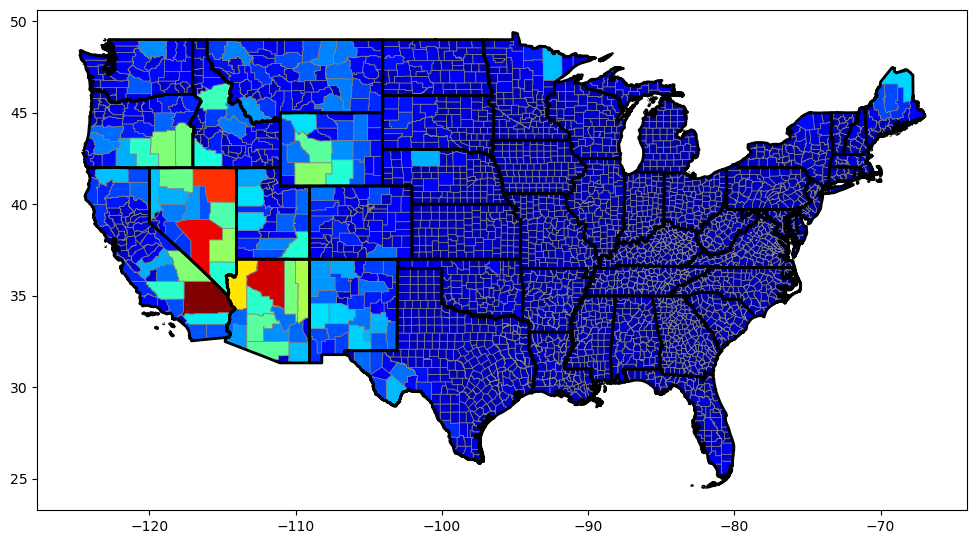

In [113]:
#Get shapefile data directly from census URLs: Just do both counties and states here
#########

url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'
url_state = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'

county_gdf = gpd.read_file(url_county)
state_gdf = gpd.read_file(url_state)

#Exclude everthing outside the contiguous US:
exclude_list = [15, 72, 2, 60, 66, 69, 78]
state_gdf = state_gdf.loc[~state_gdf['STATEFP'].astype(int).isin(exclude_list)]

county_gdf = county_gdf.loc[~county_gdf['STATEFP'].astype(int).isin(exclude_list)]
county_gdf['FIPS'] = county_gdf.STATEFP + county_gdf.COUNTYFP


#Convert to EPSG 4326 to Mask WorldClim Rasters #North American Albers is 5070
county_gdf = county_gdf.to_crs(4326)
state_gdf = state_gdf.to_crs(4326)


fig, my_ax = plt.subplots(1,1, figsize=(12, 8))
county_gdf.plot(ax = my_ax, linewidth = .5, edgecolor = 'grey', column = 'ALAND', cmap='jet')
state_gdf.plot(ax = my_ax, linewidth = 2, edgecolor = 'black', facecolor = 'none')

### Now for the rasters!

In [114]:
#My local filename, change as appropriate
#filename = 'USA_Mean_Temp_10minutes.tif'
filename = 'USA_Mean_Temp_30seconds.tif'

#Open the file:
dataset = rasterio.open(filename)


In [ ]:
#### Can check out the attributes:
#dir(dataset)

#Or:
#help(dataset)

In [115]:
##Just a few:
####

In [116]:
dataset.name

'USA_Mean_Temp_30seconds.tif'

In [117]:
dataset.mode

'r'

In [118]:
dataset.closed

False

In [119]:
dataset.width

6939

In [120]:
dataset.height

2985

In [121]:
dataset.indexes

(1,)

In [122]:
dataset.dtypes

('float32',)

In [123]:
#Bounds are in degrees:

dataset.bounds

BoundingBox(left=-124.76666666666667, bottom=24.516666666666666, right=-66.94166666666666, top=49.391666666666666)

In [124]:
#Note:

dataset.transform

Affine(0.008333333333333333, 0.0, -124.76666666666667,
       0.0, -0.008333333333333333, 49.391666666666666)

In [125]:
dataset.crs

CRS.from_epsg(4326)

#### Basic Plot:

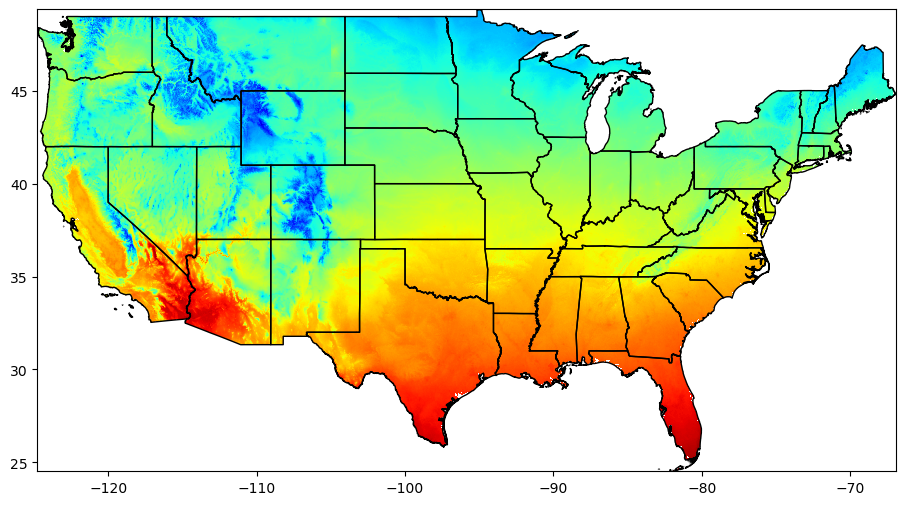

In [126]:
fig1, ax1 = plt.subplots(1,1, figsize=(12, 6))

#Often good to set interpolation = none
r = show(dataset, ax=ax1, cmap='jet', interpolation="none")

state_gdf.plot(ax=ax1, facecolor='none');

#### Reading bands into memory:

In [127]:
#We have a single band
#Read into a numpy ndarray with:

band1 = dataset.read(1)

In [128]:
band1

array([[-3.4e+38, -3.4e+38, -3.4e+38, ..., -3.4e+38, -3.4e+38, -3.4e+38],
       [-3.4e+38, -3.4e+38, -3.4e+38, ..., -3.4e+38, -3.4e+38, -3.4e+38],
       [-3.4e+38, -3.4e+38, -3.4e+38, ..., -3.4e+38, -3.4e+38, -3.4e+38],
       ...,
       [-3.4e+38, -3.4e+38, -3.4e+38, ..., -3.4e+38, -3.4e+38, -3.4e+38],
       [-3.4e+38, -3.4e+38, -3.4e+38, ..., -3.4e+38, -3.4e+38, -3.4e+38],
       [-3.4e+38, -3.4e+38, -3.4e+38, ..., -3.4e+38, -3.4e+38, -3.4e+38]],
      dtype=float32)

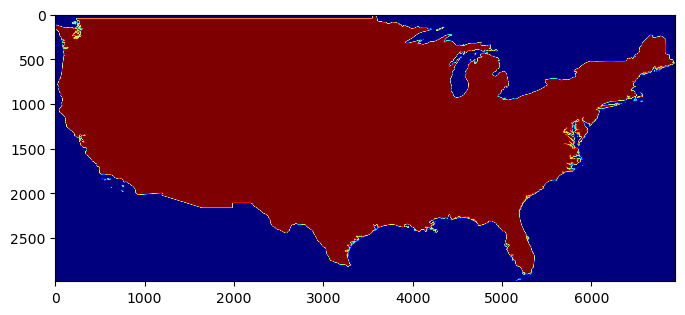

In [129]:
#Could try to plot this:
#######

fig1, ax1 = plt.subplots(1,1, figsize=(8, 6))

show(band1, ax=ax1, cmap='jet');


<AxesSubplot: >

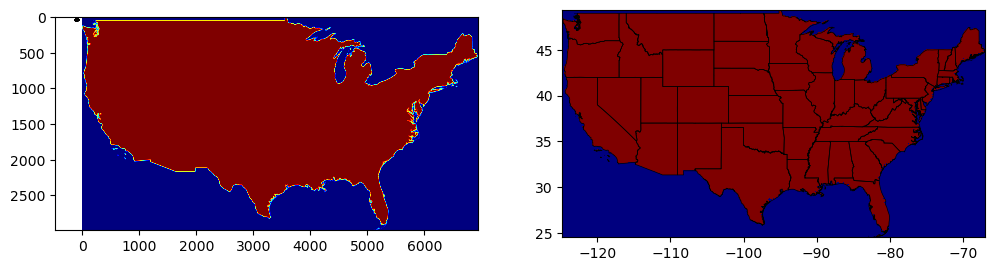

In [130]:
#Before dealing with the obvious issue that we only have red/blue + a weird border, let's get our coordinates right:
######

fig1, ax1 = plt.subplots(1,2, figsize=(12, 8))

#No good:
######
show(band1, ax=ax1[0], cmap='jet')
state_gdf.plot(ax=ax1[0], facecolor='none')


#Good:
######
#Use transform=dataset.transform"
show(band1, ax=ax1[1], cmap='jet', transform=dataset.transform, interpolation="none")
state_gdf.plot(ax=ax1[1], linewidth=.5, facecolor='none')


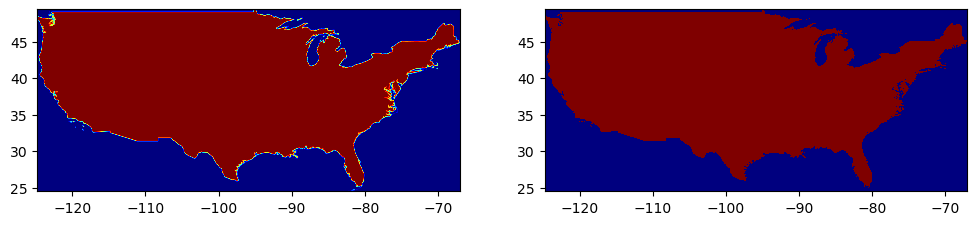

In [131]:
#Also: Get rid of interpolation in our plot:
######

fig1, ax1 = plt.subplots(1,2, figsize=(12, 8))

### Interpolation
show(band1, ax=ax1[0], cmap='jet', transform=dataset.transform)

### No interpolation
show(band1, ax=ax1[1], cmap='jet', transform=dataset.transform, interpolation="none");


In [134]:
#Now, why the monochrome? We have nodata values:
#Note that nodata is an attribute of our dataset!
dataset.nodata

#Or:
#dataset.nodatavals

-3.3999999521443642e+38

In [135]:
#We can also read in our nodata mask:
########
msk = dataset.read_masks(1)

#0 = nodata
#255 = data
print(np.unique(msk))

msk

[  0 255]


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

<AxesSubplot: >

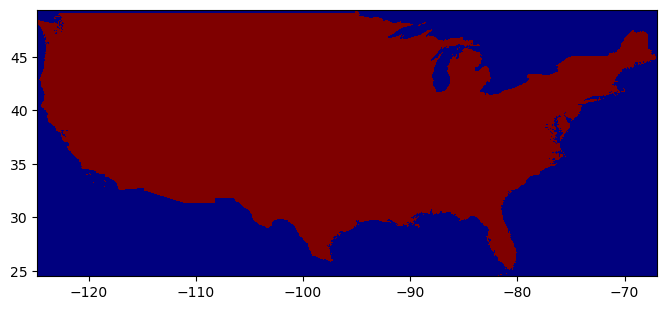

In [136]:
#Show the mask:
######

fig1, ax1 = plt.subplots(1,1, figsize=(8, 6))

show(msk, ax=ax1, cmap='jet', transform=dataset.transform, interpolation='none')

In [137]:
#We can construct a masked numpy array:
######
band1_masked = np.ma.masked_where(msk == 0, band1)

band1_masked

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=1e+20,
  dtype=float32)

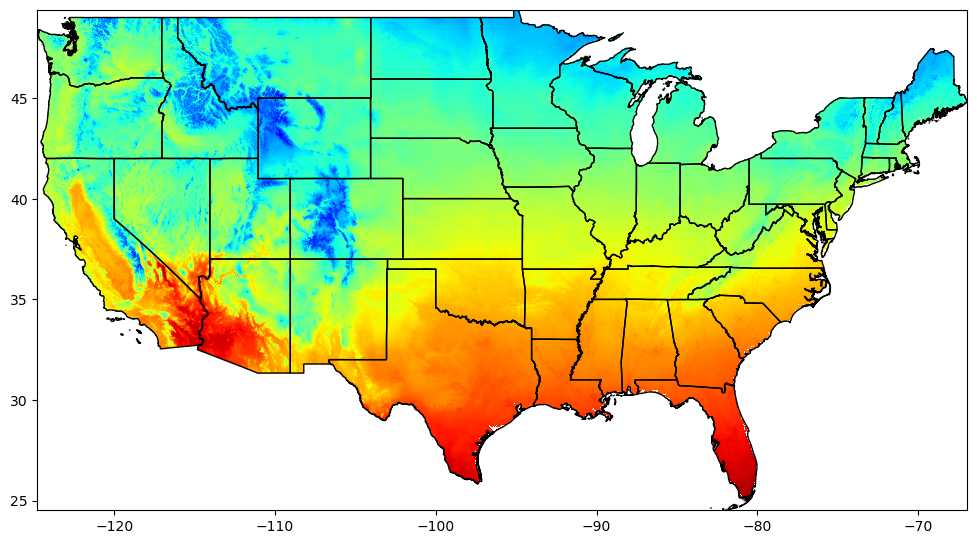

In [138]:
#And plot the masked array:
###########

fig1, ax1 = plt.subplots(1,1, figsize=(12, 8))
show(band1_masked, ax=ax1, cmap='jet', transform=dataset.transform, interpolation="none");

#Add state polygons:
state_gdf.plot(ax=ax1, facecolor='none');

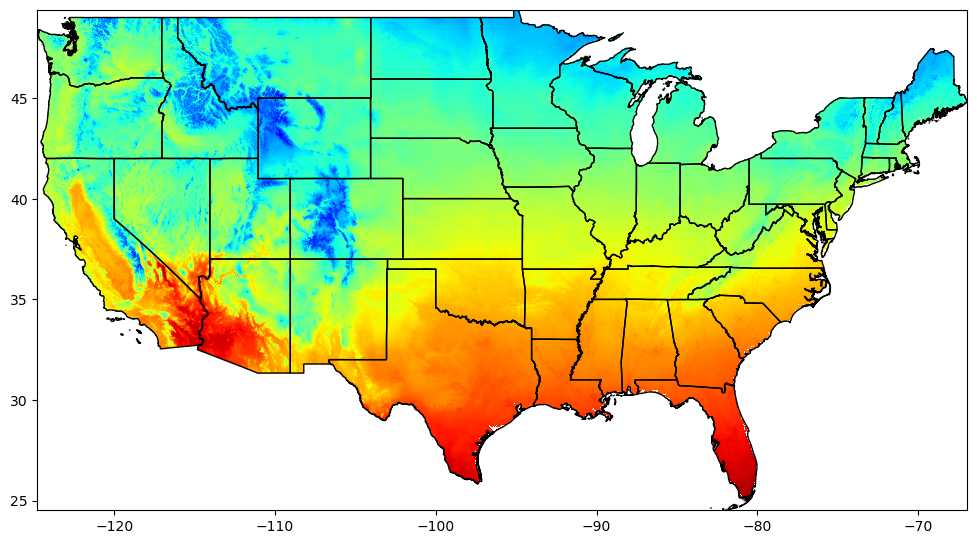

In [139]:
## Alternatively, we need only read as a masked numpy array from the start!
########
band1_masked = dataset.read(1, masked=True)

fig1, ax1 = plt.subplots(1,1, figsize=(12, 8))
show(band1_masked, ax=ax1, cmap='jet', transform=dataset.transform, interpolation="none")


#Add state polygons:
state_gdf.plot(ax=ax1, facecolor='none');

### Let's Query our Raster

#### From x,y coordinates to index

In [140]:
# Let's go from x, y to index:

#Use x, y for Phoenix, AZ:
###############

x = -112.0740
y = 33.4484

#Get the row and column index based on x, y values
row, col = dataset.index(x, y)

print(row, col)

#Value in Fahrenheit
band1[row, col] * 1.8 + 32

1913 1523


73.01750068664552

In [141]:
#Minneapolis?
#############

x = -94.6859
y = 46.7296

row, col = dataset.index(x, y)

print(row, col)
band1[row, col] * 1.8 + 32

319 3609


39.7625

In [142]:
#Note that this vectorizes nicely:
#########################

x = [-112.0740, -94.6859]
y = [33.4484, 46.7296]

row, col = dataset.index(x, y)

#Our rows and cols:
print(row, col)

#Our mean temperatures:
band1[row, col] * 1.8 + 32

[1913, 319] [1523, 3609]


array([73.0175, 39.7625], dtype=float32)

### Mean Temperatures for US Cities?

- City population and latitude/longitude data from https://simplemaps.com/data/us-cities

- Download...

In [143]:
#Get the city df:
#Here's where I downloaded it, change to your local path:
city_df = pd.read_csv('uscities.csv')

city_df

,city,city_ascii,state_id,state_name,county_fips,county_name,lat,lng,population,density,source,military,incorporated,timezone,ranking,zips,id
0,New York,New York,NY,New York,36081,Queens,40.6943,-73.9249,18680025,10768.0,shape,False,True,America/New_York,1,11229 11228 11226 11225 11224 11222 11221 1122...,1840034016
1,Los Angeles,Los Angeles,CA,California,6037,Los Angeles,34.1141,-118.4068,12531334,3267.0,shape,False,True,America/Los_Angeles,1,91367 90291 90293 90292 91316 91311 90035 9003...,1840020491
2,Chicago,Chicago,IL,Illinois,17031,Cook,41.8375,-87.6866,8586888,4576.0,shape,False,True,America/Chicago,1,60018 60649 60641 60640 60643 60642 60645 6064...,1840000494
3,Miami,Miami,FL,Florida,12086,Miami-Dade,25.7840,-80.2101,6076316,4945.0,shape,False,True,America/New_York,1,33128 33129 33125 33126 33127 33149 33144 3314...,1840015149
4,Dallas,Dallas,TX,Texas,48113,Dallas,32.7935,-96.7667,5910669,1522.0,shape,False,True,America/Chicago,1,75098 75287 75230 75231 75236 75237 75235 7525...,1840019440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30404,Drummond,Drummond,ID,Idaho,16043,Fremont,43.9996,-111.3433,1,16.4,shape,False,True,America/Boise,3,83420,1840018609
30405,Lost Springs,Lost Springs,WY,Wyoming,56009,Converse,42.7652,-104.9255,1,3.2,shape,False,True,America/Denver,3,82224 82229,1840021288
30406,Provo,Provo,SD,South Dakota,46047,Fall River,43.1937,-103.8329,1,3.1,shape,False,False,America/Denver,3,57735,1840035958
30407,Goldcreek,Goldcreek,MT,Montana,30077,Powell,46.5838,-112.9284,1,1.9,shape,False,False,America/Denver,3,59733,1840032724


In [144]:
#Drop zips to make display cleaner
######

city_df = city_df.drop(columns = ['zips'])

In [145]:
#Note that already sorted by population
city_df.head(20)

,city,city_ascii,state_id,state_name,county_fips,county_name,lat,lng,population,density,source,military,incorporated,timezone,ranking,id
0,New York,New York,NY,New York,36081,Queens,40.6943,-73.9249,18680025,10768.0,shape,False,True,America/New_York,1,1840034016
1,Los Angeles,Los Angeles,CA,California,6037,Los Angeles,34.1141,-118.4068,12531334,3267.0,shape,False,True,America/Los_Angeles,1,1840020491
2,Chicago,Chicago,IL,Illinois,17031,Cook,41.8375,-87.6866,8586888,4576.0,shape,False,True,America/Chicago,1,1840000494
3,Miami,Miami,FL,Florida,12086,Miami-Dade,25.7840,-80.2101,6076316,4945.0,shape,False,True,America/New_York,1,1840015149
4,Dallas,Dallas,TX,Texas,48113,Dallas,32.7935,-96.7667,5910669,1522.0,shape,False,True,America/Chicago,1,1840019440
5,Houston,Houston,TX,Texas,48201,Harris,29.7860,-95.3885,5724418,1394.0,shape,False,True,America/Chicago,1,1840020925
6,Philadelphia,Philadelphia,PA,Pennsylvania,42101,Philadelphia,40.0077,-75.1339,5540199,4544.0,shape,False,True,America/New_York,1,1840000673
7,Atlanta,Atlanta,GA,Georgia,13121,Fulton,33.7628,-84.4220,5151496,1419.0,shape,False,True,America/New_York,1,1840013660
8,Washington,Washington,DC,District of Columbia,11001,District of Columbia,38.9047,-77.0163,5066973,4434.0,shape,False,True,America/New_York,1,1840006060
9,Boston,Boston,MA,Massachusetts,25025,Suffolk,42.3188,-71.0852,4465966,5505.0,shape,False,True,America/New_York,1,1840000455


In [146]:
#Note unique states: We have AK, HI, and PR outside lower 48
np.unique(city_df.state_id)

array(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA',
       'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME',
       'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM',
       'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PR', 'RI', 'SC', 'SD', 'TN',
       'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY'], dtype=object)

,city,population,state_id,lng,lat,geometry
0,New York,18680025,NY,-73.9249,40.6943,POINT (-73.92490 40.69430)
1,Los Angeles,12531334,CA,-118.4068,34.1141,POINT (-118.40680 34.11410)
2,Chicago,8586888,IL,-87.6866,41.8375,POINT (-87.68660 41.83750)
3,Miami,6076316,FL,-80.2101,25.7840,POINT (-80.21010 25.78400)
4,Dallas,5910669,TX,-96.7667,32.7935,POINT (-96.76670 32.79350)


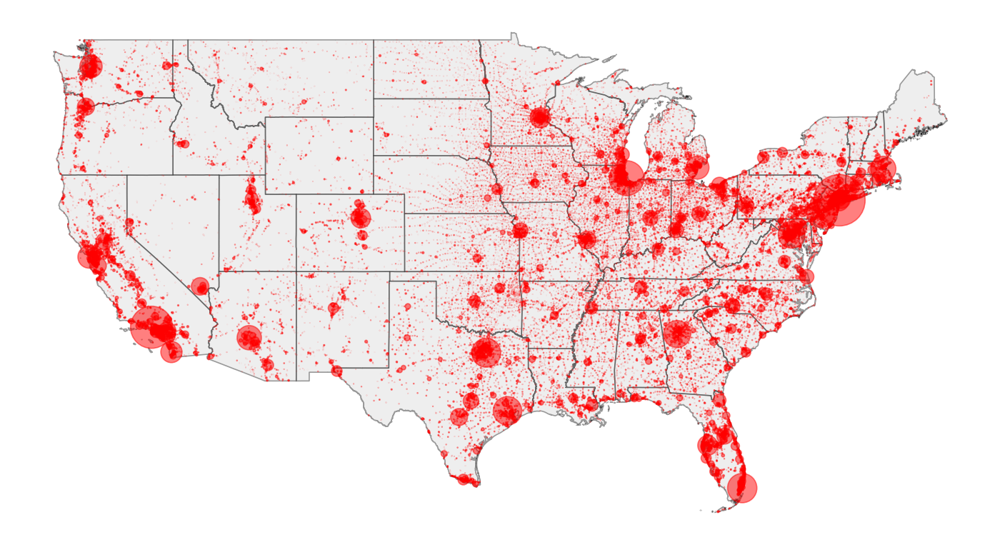

In [147]:
## Can make a GeoDataFrame for better display purposes
###################

#Just keep city name, population, state_id, and lng/lat for now
gdf_city = gpd.GeoDataFrame(city_df[['city', 'population', 'state_id', 'lng', 'lat']], geometry =
                            gpd.points_from_xy(city_df.lng, city_df.lat), crs = "EPSG:4326")

#Also drop anything outside the lower 48:
gdf_city = gdf_city.loc[~gdf_city.state_id.isin(['AK', 'HI', 'PR'])]

display(gdf_city.head())


#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(16, 8), dpi=120)

#Plot top N cities
N = len(gdf_city)
state_gdf.plot(ax = ax1, facecolor = 'lightgrey', edgecolor='black', alpha=.375)

gdf_city.iloc[:N].plot(ax = ax1, markersize = gdf_city.iloc[:N].population / 1e4, color='red', alpha=.5);

ax1.set_axis_off()

In [148]:
#Now get mean temperature for each city:
#########################

row, col = dataset.index(gdf_city.lng, gdf_city.lat)

z = band1[row, col] * 1.8 + 32

#And add to the city gdf:
gdf_city['T_Mean'] = z

In [149]:
#Drop infinites from the gdf:
gdf_city = gdf_city.loc[~np.isinf(gdf_city['T_Mean'])]


#### And pretty plot:

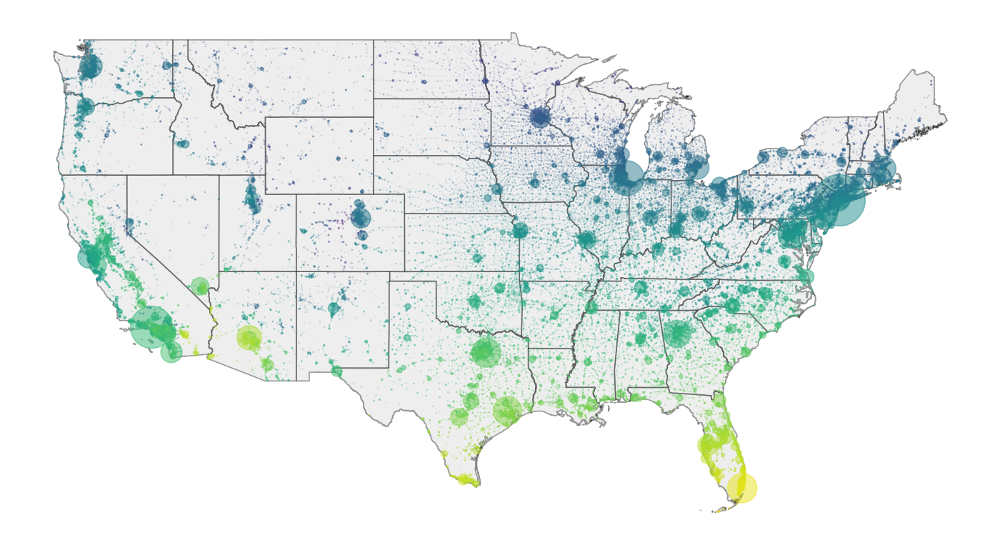

In [150]:
#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(16, 8), dpi=120)

#Plot top N cities
N = len(gdf_city)
state_gdf.plot(ax = ax1, facecolor = 'lightgrey', edgecolor='black', alpha=.375)

gdf_city.iloc[:N].plot(ax = ax1, markersize = gdf_city.iloc[:N].population / 1e4, column='T_Mean',
                       alpha=.5, cmap='viridis');

ax1.set_axis_off()

In [151]:
#Also, hottest cities??

gdf_city.sort_values(by = 'T_Mean', ascending=False).head(20)


,city,population,state_id,lng,lat,geometry,T_Mean
17090,Duck Key,761,FL,-80.9132,24.7710,POINT (-80.91320 24.77100),77.922501
5567,"Islamorada, Village of Islands",6384,FL,-80.6098,24.9407,POINT (-80.60980 24.94070),77.794998
9585,Big Coppitt Key,2644,FL,-81.6574,24.5914,POINT (-81.65740 24.59140),77.367493
6781,Stock Island,4692,FL,-81.7351,24.5658,POINT (-81.73510 24.56580),77.322495
1828,Key West,24495,FL,-81.7775,24.5642,POINT (-81.77750 24.56420),77.247498
19527,Key Colony Beach,523,FL,-81.0216,24.7233,POINT (-81.02160 24.72330),77.172501
4443,Marathon,8746,FL,-81.0374,24.7263,POINT (-81.03740 24.72630),77.165001
10694,Cudjoe Key,2157,FL,-81.4986,24.6745,POINT (-81.49860 24.67450),77.127502
6631,Big Pine Key,4853,FL,-81.3676,24.6893,POINT (-81.36760 24.68930),77.052498
27422,Layton,107,FL,-80.8128,24.8247,POINT (-80.81280 24.82470),77.022499


In [152]:
#Compare to a couple cities in AZ:
######

gdf_city.loc[gdf_city.city.isin(['Phoenix', 'Flagstaff'])]

,city,population,state_id,lng,lat,geometry,T_Mean
10,Phoenix,4187723,AZ,-112.0892,33.5722,POINT (-112.08920 33.57220),72.177498
599,Flagstaff,79624,AZ,-111.6194,35.1872,POINT (-111.61940 35.18720),46.864998
6836,Phoenix,4624,OR,-122.8154,42.2749,POINT (-122.81540 42.27490),53.682499
9587,Phoenix,2643,NY,-76.2961,43.2316,POINT (-76.29610 43.23160),46.917500
13184,Phoenix,1402,IL,-87.6308,41.6118,POINT (-87.63080 41.61180),50.209999


### Weighted Histogram with seaborn

- Look at our city temperature distribution, weighted by population

In [153]:
#First load the library as usual:
import seaborn as sns

(29.0, 82.0)

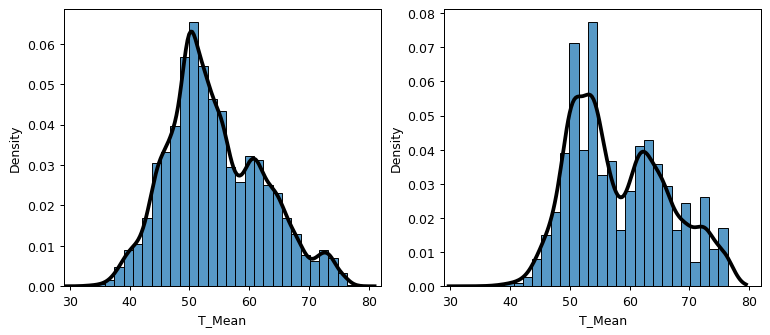

In [154]:
#Compare weighted vs. unweighted:
fig, ax1 = plt.subplots(1,2, figsize=(10, 4), dpi=90)

gdf = gdf_city #gdf_city.iloc[:1000]

N = 30
#Unweighted:
#Note that bw_method can be 'scott', 'silverman', or a specific number; default is 'scott'
sns.histplot(data=gdf, x="T_Mean", bins=N, ax=ax1[0], stat="density")
sns.kdeplot(data=gdf, x="T_Mean", ax=ax1[0], color='black', linewidth=3)


#Weighted:
sns.histplot(data=gdf, x="T_Mean", bins=N, weights='population', ax=ax1[1], stat="density")
sns.kdeplot(data=gdf, x="T_Mean", ax=ax1[1], weights='population', color='black', linewidth=3, bw_adjust=.5)


ax1[0].set_xlim([29,82])
ax1[1].set_xlim([29,82])

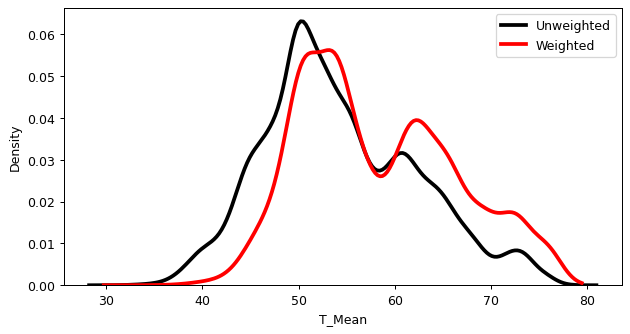

In [155]:
#Plot superimposed:
#######

fig, ax1 = plt.subplots(1,1, figsize=(8, 4), dpi=90)

sns.kdeplot(data=gdf, x="T_Mean", ax=ax1, color='black', linewidth=3, label='Unweighted')
sns.kdeplot(data=gdf, x="T_Mean", ax=ax1, weights='population', color='red', linewidth=3, bw_adjust=.5, label='Weighted')

ax1.legend();

#### Population-weighted average temperature:


In [156]:
#Weighted average:
np.average(gdf_city.T_Mean, weights=gdf_city.population)

58.230521545010724

In [157]:
#vs unweighted:
np.average(gdf_city.T_Mean)

54.294086

## Mean Temperature of the Contiguous US?

- We want to take the mean across our raster...

- Problem: We need an equal-area projection!

- Re-project...

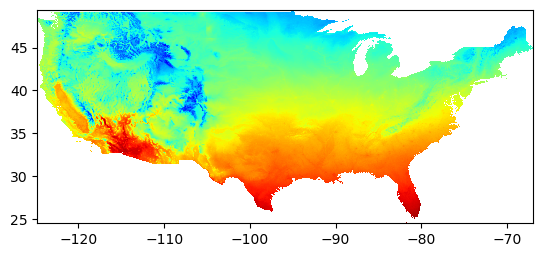

In [158]:
#Recall out temperature data is loaded in band1_masked
show(band1_masked, cmap='jet', transform=dataset.transform, interpolation="none");

In [159]:
#Naive mean:
#######

band1_masked.mean() * 1.8 + 32

51.724778136790356

### Re-project

- Let's reproject to EPSG 5070, North American Albers Equal Area
- Adopted from the documentation:

In [ ]:
%%time

#From the documentation, with some modifications, we have the following motif:
###########

from rasterio.warp import calculate_default_transform, reproject, Resampling

#Project to Albers Equal Area
dst_crs = 'EPSG:5070'

source_name = 'USA_Mean_Temp_30seconds.tif'
dest_name = 'USA_Mean_Temp_30seconds_EPSG5070.tif'


with rasterio.open(source_name) as src:
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    
    kwargs = src.meta.copy()
    
    #Can add 'compress':'lzw' Runs faster, saves space!
    #Lempel–Ziv–Welch compression: Loss-less
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height,
        'compress':'lzw'
    })

    
    with rasterio.open(dest_name, 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

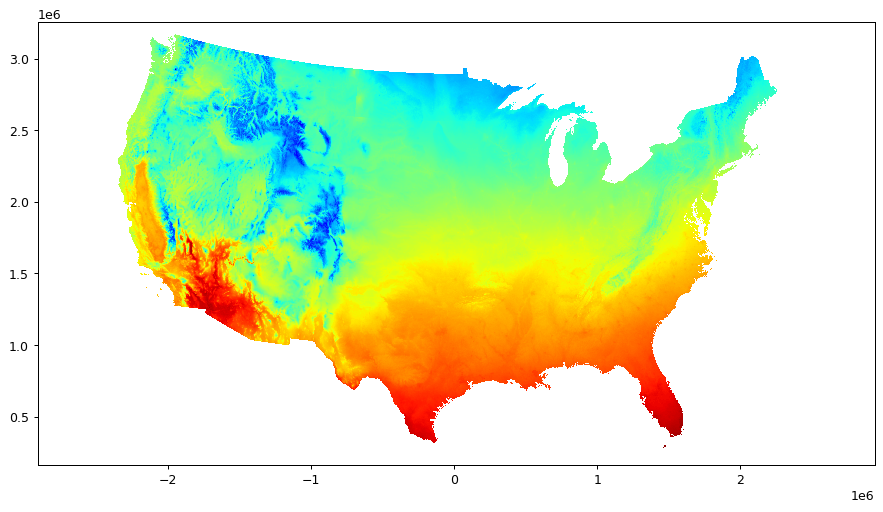

In [160]:
#Read back in and display...
#####

#Open the file:
filename = 'USA_Mean_Temp_30seconds_EPSG5070.tif'
dataset_5070 = rasterio.open(filename)

#And read the only band:
band1_5070_masked = dataset_5070.read(1, masked=True)

fig1, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=90)
show(band1_5070_masked, ax=ax1, cmap='jet', transform=dataset_5070.transform, interpolation="none");

#Can also close, but we'll use later:
#dataset_5070.close()

In [161]:
#Average temperature now?
#########

band1_5070_masked.mean() * 1.8 + 32

52.32105638256952

In [162]:
#Note the resolution of our new raster:
dataset_5070.res


(750.9252133671389, 750.9252133671389)

In [163]:
#Vs resolution of original raster:
dataset.res

(0.008333333333333333, 0.008333333333333333)

### Sanity Check: Does the area of the raster check out?

In [164]:
#We have a lot that is masked:

band1_5070_masked.mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [165]:
#Check area that is not masked:
#Number of unmasked cells, times the resolution:
x_res = dataset_5070.res[0]; y_res = dataset_5070.res[1]

#Get in millions of square kilometers:
np.sum(~band1_5070_masked.mask) * x_res * y_res / 1e6 / 1e6

7.790290098739193

In [168]:
#We can re-project our state GeoDataFrame for plotting purposes:

state_gdf_5070 = state_gdf.to_crs(5070)

#And compare area of our GeoDataFrame to our raster:
state_gdf_5070.area.sum() / 1e12

7.804411879844359

In [169]:
#And how close are these?
############

a = np.sum(~band1_5070_masked.mask) * x_res * y_res / 1e12
b = state_gdf_5070.area.sum() / 1e12

a/b

#Hooray, sanity check passed!

0.9981905387205875

### And plot:

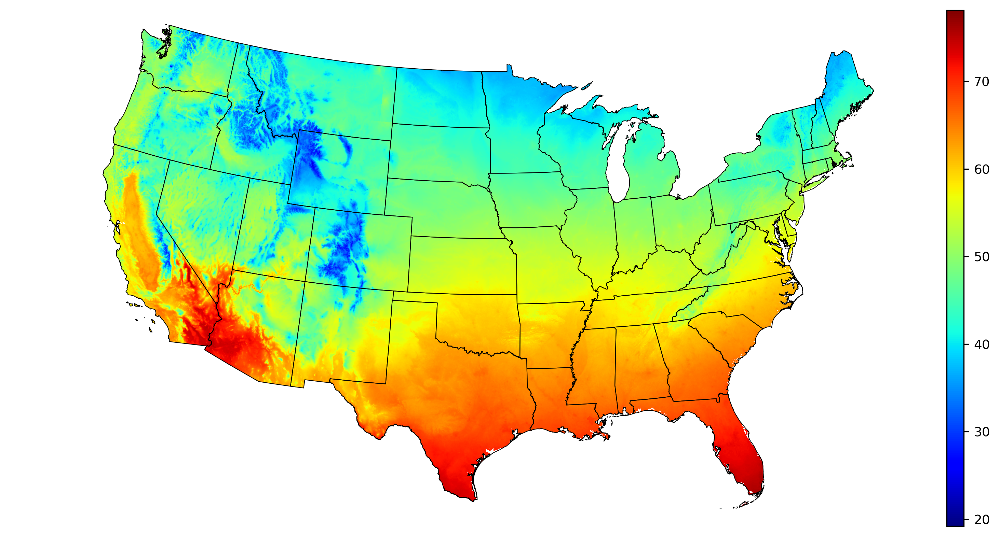

In [170]:
#Now, plot again with our state vectors as backdrop:
#########
fig1, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

#Convert to F for this one
r = show(band1_5070_masked * 1.8 + 32, ax=ax1, cmap='jet', transform=dataset_5070.transform, interpolation="none")
state_gdf_5070.plot(ax=ax1, facecolor='none', linewidth=.5)


#Let's also add a colorbar here:
#####
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="1.75%", pad=-0.4)

im = r.get_images()[0]
fig1.colorbar(im, ax=ax1, cax=cax)

#Set the colorbar tick params
cax.tick_params(axis='both', labelsize=9)


ax1.set_axis_off()


In [171]:
#Throw in the cities in our new projection
########

gdf_city_5070 = gdf_city.to_crs(5070)


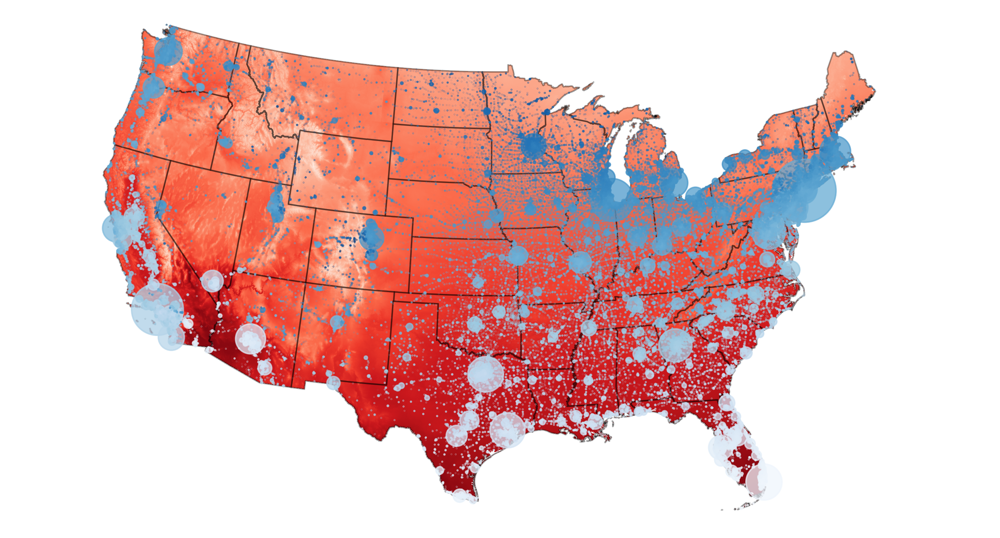

In [174]:
#Plot:
#Can play around with the colormaps and such

fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

#Plot top N cities
N = len(gdf_city)
state_gdf_5070.plot(ax = ax1, facecolor = 'none', edgecolor='black', alpha=.375)

#Temperature
show(band1_5070_masked, ax=ax1, cmap='Reds', transform=dataset_5070.transform, interpolation="none", alpha=1)

#Cities
gdf_city_5070.iloc[:N].plot(ax = ax1, markersize = gdf_city_5070.iloc[:N].population / 1e4, column='T_Mean',
                       alpha=.75, cmap='Blues_r');

ax1.set_axis_off()

### Finally: Real Quick Temperature histogram

We need to flatten our temperature ndarray, and then can make a quick histogram...

In [175]:
z = band1_5070_masked.flatten() * 1.8 + 32

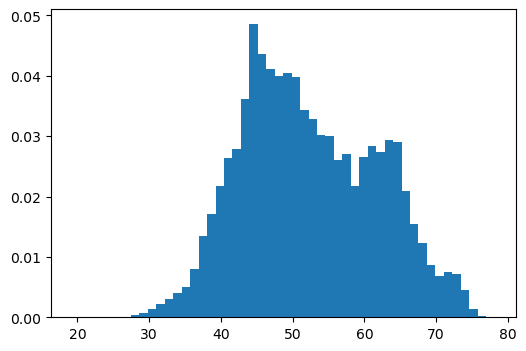

In [176]:
fig, ax1 = plt.subplots(1,1, figsize=(6, 4))

N = 50
ax1.hist(z, bins=N, density=True);